# T-SNE


1.**um-before**


/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FF/lipnet_forget_embedding.npy

/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FF/lipnet_test_embedding.npy

2.**uram-before**

/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_forget_embedding.npy

/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_test_embedding.npy

3.**uram-after**

/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FF/lipnet_forget_embedding_ft.npy

/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FF/lipnet_test_embedding_ft.npy


/tmp/ipykernel_94849/4192327266.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)


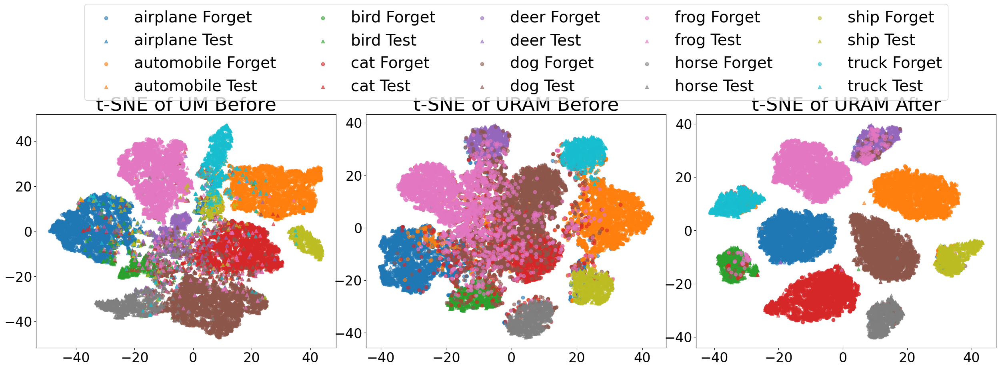

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from MulticoreTSNE import MulticoreTSNE as TSNE

# CIFAR-10 Class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 
            'dog', 'frog', 'horse', 'ship', 'truck']

# Function to load data, apply PCA, and perform t-SNE
def load_and_tsne(forget_path, test_path, forget_labels_path, test_labels_path, n_components=50, tsne_components=2, n_jobs=8):
    forget_embedding = np.load(forget_path)
    test_embedding = np.load(test_path)
    forget_labels = np.load(forget_labels_path)
    test_labels = np.load(test_labels_path)
    
    # Concatenate embeddings and labels
    embeddings = np.concatenate((forget_embedding, test_embedding), axis=0)
    labels = np.concatenate((forget_labels, test_labels), axis=0)
    
    # Apply PCA to reduce dimensions before t-SNE
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(embeddings)
    
    # Apply t-SNE using MulticoreTSNE for speedup
    tsne = TSNE(n_components=tsne_components, n_jobs=n_jobs, random_state=42)
    tsne_result = tsne.fit_transform(pca_result)
    
    return tsne_result, labels, len(forget_embedding)


# Compute t-SNE for each case
tsne_um_before, labels_um_before, n_forget_um_before = load_and_tsne(
    paths_GA["um-before"]["forget"], paths_GA["um-before"]["test"],
    paths_GA["um-before"]["forget_labels"], paths_GA["um-before"]["test_labels"]
)
tsne_uram_before, labels_uram_before, n_forget_uram_before = load_and_tsne(
    paths_GA["uram-before"]["forget"], paths_GA["uram-before"]["test"],
    paths_GA["uram-before"]["forget_labels"], paths_GA["uram-before"]["test_labels"]
)
tsne_uram_after, labels_uram_after, n_forget_uram_after = load_and_tsne(
    paths_GA["uram-after"]["forget"], paths_GA["uram-after"]["test"],
    paths_GA["uram-after"]["forget_labels"], paths_GA["uram-after"]["test_labels"]
)

# Plotting parameters
title_fontsize = 34  # Title font size
legend_fontsize = 28  # Legend font size
label_fontsize = 24  # Axis label font size


plt.style.use("default")

# Plotting the t-SNE results side by side
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
colors = plt.cm.get_cmap("tab10", 10)

# Plot um-before
for i in range(10):
    forget_indices = np.where(labels_um_before[:n_forget_um_before] == i)[0]
    test_indices = np.where(labels_um_before[n_forget_um_before:] == i)[0] + n_forget_um_before
    
    axes[0].scatter(tsne_um_before[forget_indices, 0],
                    tsne_um_before[forget_indices, 1],
                    color=colors(i), marker='o', label=f'{class_names[i]} Forget', alpha=0.6)
    axes[0].scatter(tsne_um_before[test_indices, 0],
                    tsne_um_before[test_indices, 1],
                    color=colors(i), marker='^', label=f'{class_names[i]} Test', alpha=0.6)
axes[0].set_title('t-SNE of UM Before', fontsize=title_fontsize)
axes[0].tick_params(axis='both', which='major', labelsize=label_fontsize)

# Plot uram-before
for i in range(10):
    forget_indices = np.where(labels_uram_before[:n_forget_uram_before] == i)[0]
    test_indices = np.where(labels_uram_before[n_forget_uram_before:] == i)[0] + n_forget_uram_before
    
    axes[1].scatter(tsne_uram_before[forget_indices, 0],
                    tsne_uram_before[forget_indices, 1],
                    color=colors(i), marker='o', label=f'{class_names[i]} Forget', alpha=0.6)
    axes[1].scatter(tsne_uram_before[test_indices, 0],
                    tsne_uram_before[test_indices, 1],
                    color=colors(i), marker='^', label=f'{class_names[i]} Test', alpha=0.6)
axes[1].set_title('t-SNE of URAM Before', fontsize=title_fontsize)
axes[1].tick_params(axis='both', which='major', labelsize=label_fontsize)

# Plot uram-after
for i in range(10):
    forget_indices = np.where(labels_uram_after[:n_forget_uram_after] == i)[0]
    test_indices = np.where(labels_uram_after[n_forget_uram_after:] == i)[0] + n_forget_uram_after
    
    axes[2].scatter(tsne_uram_after[forget_indices, 0],
                    tsne_uram_after[forget_indices, 1],
                    color=colors(i), marker='o', label=f'{class_names[i]} Forget', alpha=0.6)
    axes[2].scatter(tsne_uram_after[test_indices, 0],
                    tsne_uram_after[test_indices, 1],
                    color=colors(i), marker='^', label=f'{class_names[i]} Test', alpha=0.6)
axes[2].set_title('t-SNE of URAM After', fontsize=title_fontsize)
axes[2].tick_params(axis='both', which='major', labelsize=label_fontsize)

# Add a single flat legend above the plot
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', fontsize=legend_fontsize, ncol=5, bbox_to_anchor=(0.5, 1.15))

# Adjust layout to minimize side margins and fill the space
fig.subplots_adjust(left=0, right=1, top=0.78, bottom=0.05, wspace=0.1)
plt.show()


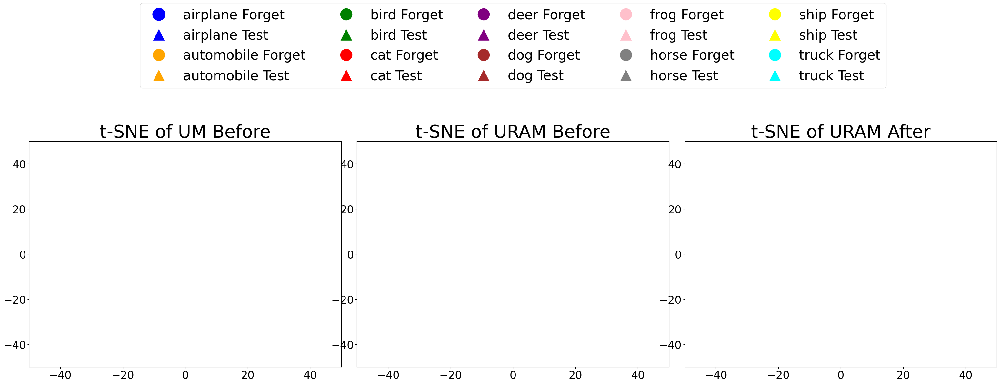

In [ ]:
import matplotlib.pyplot as plt

# CIFAR-10 Class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 
            'dog', 'frog', 'horse', 'ship', 'truck']

# Plotting parameters
title_fontsize = 40  # Title font size
legend_fontsize = 30  # Legend font size
label_fontsize = 24  # Axis label font size

# Plotting placeholders for the t-SNE results side by side
fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Increase figure size to give more space to subplots

# Plot placeholders for each subplot
for ax, title in zip(axes, ['t-SNE of UM Before', 't-SNE of URAM Before', 't-SNE of URAM After']):
    ax.set_title(title, fontsize=title_fontsize)
    ax.tick_params(axis='both', which='major', labelsize=label_fontsize)
    ax.set_xlim(-50, 50)  # Placeholder for x-limits
    ax.set_ylim(-50, 50)  # Placeholder for y-limits

# Add a single flat legend above the plot
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='b', markersize=30, label='airplane Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='b', markersize=28, label='airplane Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=28, label='automobile Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='orange', markersize=28, label='automobile Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=28, label='bird Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='g', markersize=28, label='bird Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='r', markersize=28, label='cat Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='r', markersize=28, label='cat Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=28, label='deer Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='purple', markersize=28, label='deer Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='brown', markersize=28, label='dog Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='brown', markersize=28, label='dog Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='pink', markersize=28, label='frog Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='pink', markersize=28, label='frog Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=28, label='horse Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', markersize=28, label='horse Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='yellow', markersize=28, label='ship Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='yellow', markersize=28, label='ship Test'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='cyan', markersize=28, label='truck Forget'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='cyan', markersize=28, label='truck Test')
]

fig.legend(handles=handles, loc='upper center', fontsize=legend_fontsize, ncol=5, bbox_to_anchor=(0.5, 1.20))

# Adjust layout to minimize side margins and fill the space
fig.subplots_adjust(left=0, right=1, top=0.75, bottom=0.05, wspace=0.05)
plt.show()


In [30]:
import numpy as np
import os

paths_retrain = {
    "um-before": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/retrain/retrain_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/retrain/retrain_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
        
    },
    "uram-before": {
        "forget":  "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":    "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    },
    "uram-after": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/retrain/lipnet_forget_embedding_ft.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/retrain/lipnet_test_embedding_ft.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    }
}

paths_FF = {
    "um-before": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FF/fisher_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FF/fisher_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
        
    },
    "uram-before": {
        "forget":  "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":    "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    },
    "uram-after": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FF/lipnet_forget_embedding_ft.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FF/lipnet_test_embedding_ft.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    }
}


paths_IU = {
    "um-before": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/IU/wfisher_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/IU/wfisher_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
        
    },
    "uram-before": {
        "forget":  "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":    "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    },
    "uram-after": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/IU/lipnet_forget_embedding_ft.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/IU/lipnet_test_embedding_ft.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    }
}



paths_FT = {
    "um-before": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FT/FT_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FT/FT_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
        
    },
    "uram-before": {
        "forget":  "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":    "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    },
    "uram-after": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FT/lipnet_forget_embedding_ft.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FT/lipnet_test_embedding_ft.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    }
}



paths_FT_prune = {
    "um-before": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FT_prune/FT_prune_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FT_prune/FT_prune_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
        
    },
    "uram-before": {
        "forget":  "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":    "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    },
    "uram-after": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FT_prune/lipnet_forget_embedding_ft.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/FT_prune/lipnet_test_embedding_ft.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    }
}


paths_GA = {
    "um-before": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/GA/GA_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/GA/GA_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
        
    },
    "uram-before": {
        "forget":  "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_forget_embedding.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":    "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_test_embedding.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    },
    "uram-after": {
        "forget":        "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/GA/lipnet_forget_embedding_ft.npy",
        "forget_labels": "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy",
        "test":          "/nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/GA/lipnet_test_embedding_ft.npy",
        "test_labels":   "/nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy",
    }
}

# Function to check if all files exist
def check_files_exist(paths_dict):
    for paths_name, paths in paths_dict.items():
        print(f"\nChecking files in {paths_name}...")
        for key, value in paths.items():
            print(f"  Checking {key} files...")
            for sub_key, sub_value in value.items():
                if not os.path.exists(sub_value):
                    print(f"    File not found: {sub_value}")
                else:
                    print(f"    File exists: {sub_value}")

# Function to check the shapes and data types
def check_shapes_and_data(paths_dict):
    for paths_name, paths in paths_dict.items():
        for key, value in paths.items():
            print(f"\nChecking shapes for {key} in {paths_name}:")

            # Load embeddings
            forget_embed = np.load(value['forget'])
            test_embed = np.load(value['test'])
            
            print(f"  forget_embedding shape: {forget_embed.shape}")  # Expecting (11250, 512) or similar
            print(f"  test_embedding shape: {test_embed.shape}")      # Expecting (10000, 512) or similar
            
            # Ensure that embedding dimensions match
            assert forget_embed.shape[1] == test_embed.shape[1], "Mismatch in embedding dimensions between forget and test embeddings"

# Dictionary of all paths_* variables
all_paths = {
    'retrain': paths_retrain,
    'FF': paths_FF,
    'IU': paths_IU,
    'FT': paths_FT,
    'FT_prune': paths_FT_prune,
    'GA': paths_GA
}

# Run the file existence check for all paths
check_files_exist(all_paths)

# Run the shape and data type check for all paths
check_shapes_and_data(all_paths)

print("\nAll checks passed. The data structure appears to be correct.")



Checking files in retrain...
  Checking um-before files...
    File exists: /nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/retrain/retrain_forget_embedding.npy
    File exists: /nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy
    File exists: /nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/resnet18_cifar10/retrain/retrain_test_embedding.npy
    File exists: /nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy
  Checking uram-before files...
    File exists: /nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_forget_embedding.npy
    File exists: /nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/forget_label.npy
    File exists: /nvme/szh/data/3ai/lips/outputs-after-ft04-pm-1623/lipnet/resnet18/cifar10/lipnet_test_embedding.npy
    File exists: /nvme/szh/data/3ai/lips/saved_data_embedding/cifar10/test_label.npy
  Checking uram-after files...
    File exists: /nvme/szh/data/3ai/lips/outputs-afte

/tmp/ipykernel_94849/1265862296.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)


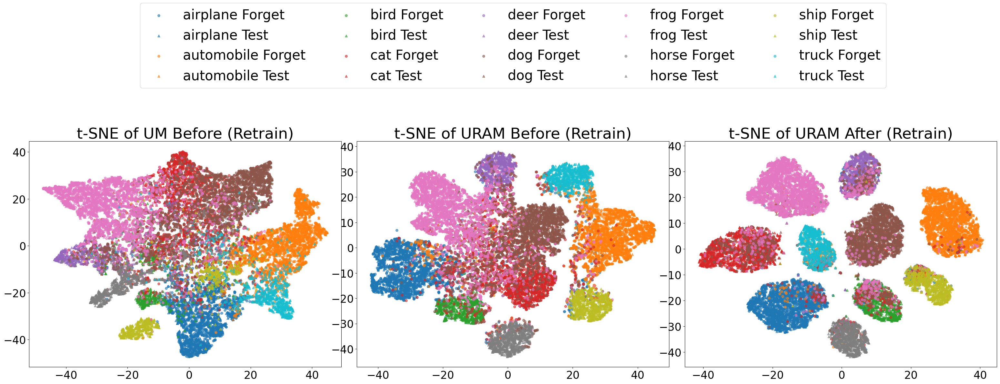

/tmp/ipykernel_94849/1265862296.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)


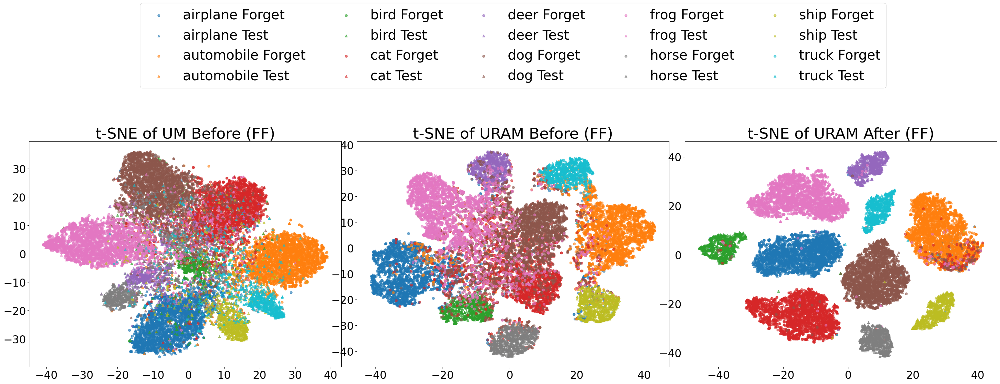

/tmp/ipykernel_94849/1265862296.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)


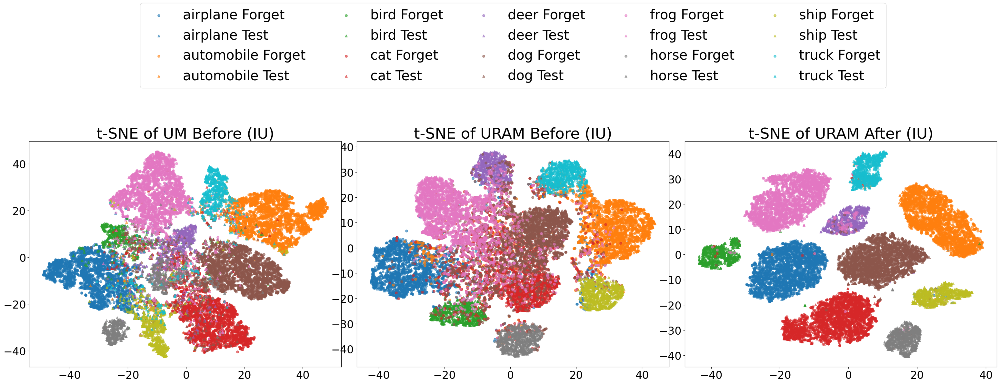

/tmp/ipykernel_94849/1265862296.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)


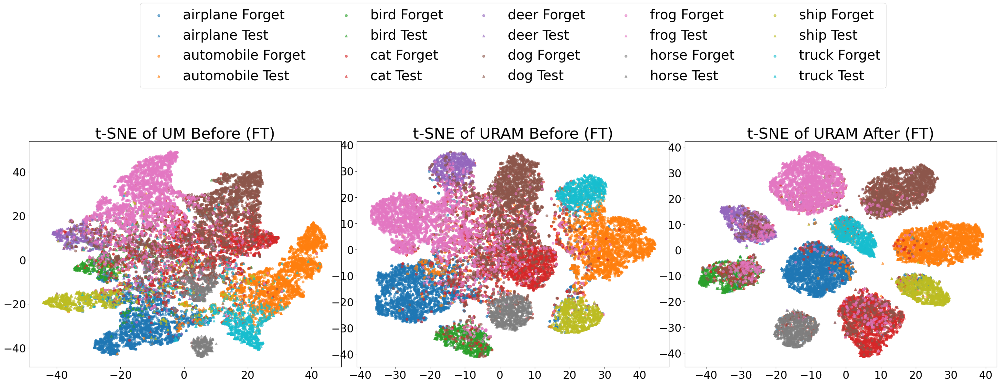

/tmp/ipykernel_94849/1265862296.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)


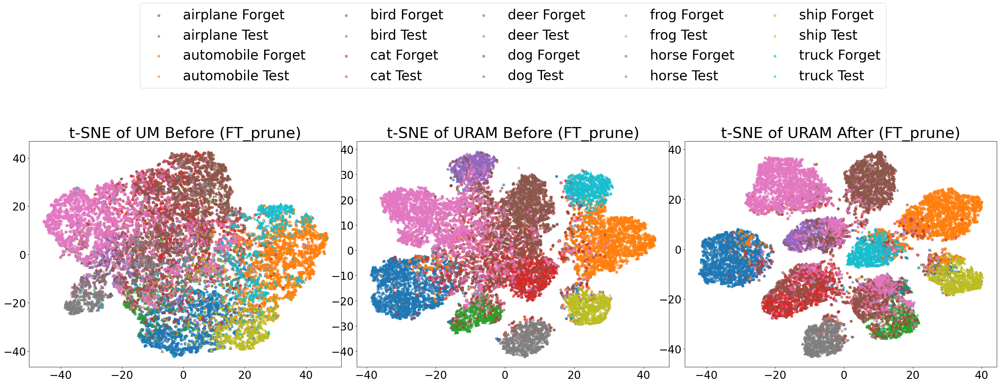

/tmp/ipykernel_94849/1265862296.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)


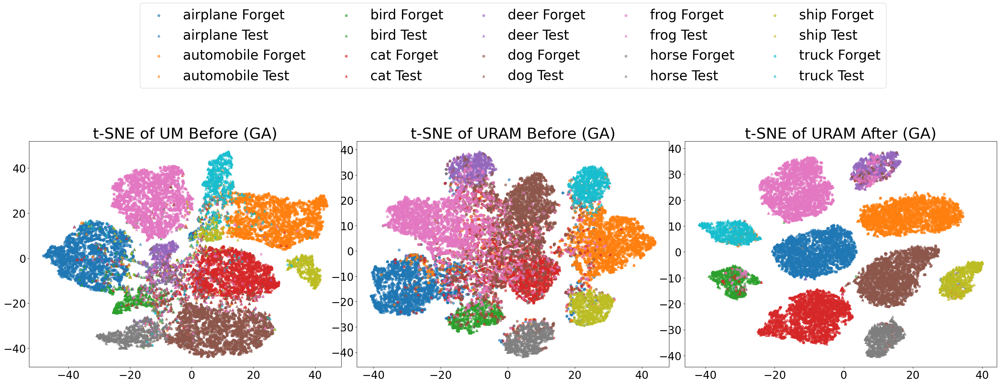

In [32]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from MulticoreTSNE import MulticoreTSNE as TSNE

# CIFAR-10 Class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 
            'dog', 'frog', 'horse', 'ship', 'truck']

# All paths dictionaries
all_paths = {
    "Retrain": paths_retrain,
    "FF": paths_FF,
    "IU": paths_IU,
    "FT": paths_FT,
    "FT_prune": paths_FT_prune,
    "GA": paths_GA
}

# Function to load data, apply PCA, and perform t-SNE
def load_and_tsne(forget_path, test_path, forget_labels_path, test_labels_path, n_components=50, tsne_components=2, n_jobs=8):
    forget_embedding = np.load(forget_path)
    test_embedding = np.load(test_path)
    forget_labels = np.load(forget_labels_path)
    test_labels = np.load(test_labels_path)
    
    # Concatenate embeddings and labels
    embeddings = np.concatenate((forget_embedding, test_embedding), axis=0)
    labels = np.concatenate((forget_labels, test_labels), axis=0)
    
    # Apply PCA to reduce dimensions before t-SNE
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(embeddings)
    
    # Apply t-SNE using MulticoreTSNE for speedup
    tsne = TSNE(n_components=tsne_components, n_jobs=n_jobs, random_state=42)
    tsne_result = tsne.fit_transform(pca_result)
    
    return tsne_result, labels, len(forget_embedding)

# Plotting parameters
title_fontsize = 34  # Title font size
legend_fontsize = 30  # Legend font size
label_fontsize = 24  # Axis label font size
marker_size = 28  # Marker size for scatter plots

# Loop through each method in all_paths
for method_name, paths in all_paths.items():
    # Compute t-SNE for each case
    tsne_um_before, labels_um_before, n_forget_um_before = load_and_tsne(
        paths["um-before"]["forget"], paths["um-before"]["test"],
        paths["um-before"]["forget_labels"], paths["um-before"]["test_labels"]
    )
    tsne_uram_before, labels_uram_before, n_forget_uram_before = load_and_tsne(
        paths["uram-before"]["forget"], paths["uram-before"]["test"],
        paths["uram-before"]["forget_labels"], paths["uram-before"]["test_labels"]
    )
    tsne_uram_after, labels_uram_after, n_forget_uram_after = load_and_tsne(
        paths["uram-after"]["forget"], paths["uram-after"]["test"],
        paths["uram-after"]["forget_labels"], paths["uram-after"]["test_labels"]
    )

    plt.style.use("default")

    # Plotting the t-SNE results side by side
    fig, axes = plt.subplots(1, 3, figsize=(30, 10))
    colors = plt.cm.get_cmap("tab10", 10)

    # Plot um-before
    for i in range(10):
        forget_indices = np.where(labels_um_before[:n_forget_um_before] == i)[0]
        test_indices = np.where(labels_um_before[n_forget_um_before:] == i)[0] + n_forget_um_before
        
        axes[0].scatter(tsne_um_before[forget_indices, 0],
                        tsne_um_before[forget_indices, 1],
                        color=colors(i), marker='o', label=f'{class_names[i]} Forget', alpha=0.6, s=marker_size)
        axes[0].scatter(tsne_um_before[test_indices, 0],
                        tsne_um_before[test_indices, 1],
                        color=colors(i), marker='^', label=f'{class_names[i]} Test', alpha=0.6, s=marker_size)
    axes[0].set_title(f't-SNE of UM Before ({method_name})', fontsize=title_fontsize)
    axes[0].tick_params(axis='both', which='major', labelsize=label_fontsize)

    # Plot uram-before
    for i in range(10):
        forget_indices = np.where(labels_uram_before[:n_forget_uram_before] == i)[0]
        test_indices = np.where(labels_uram_before[n_forget_uram_before:] == i)[0] + n_forget_uram_before
        
        axes[1].scatter(tsne_uram_before[forget_indices, 0],
                        tsne_uram_before[forget_indices, 1],
                        color=colors(i), marker='o', label=f'{class_names[i]} Forget', alpha=0.6, s=marker_size)
        axes[1].scatter(tsne_uram_before[test_indices, 0],
                        tsne_uram_before[test_indices, 1],
                        color=colors(i), marker='^', label=f'{class_names[i]} Test', alpha=0.6, s=marker_size)
    axes[1].set_title(f't-SNE of URAM Before ({method_name})', fontsize=title_fontsize)
    axes[1].tick_params(axis='both', which='major', labelsize=label_fontsize)

    # Plot uram-after
    for i in range(10):
        forget_indices = np.where(labels_uram_after[:n_forget_uram_after] == i)[0]
        test_indices = np.where(labels_uram_after[n_forget_uram_after:] == i)[0] + n_forget_uram_after
        
        axes[2].scatter(tsne_uram_after[forget_indices, 0],
                        tsne_uram_after[forget_indices, 1],
                        color=colors(i), marker='o', label=f'{class_names[i]} Forget', alpha=0.6, s=marker_size)
        axes[2].scatter(tsne_uram_after[test_indices, 0],
                        tsne_uram_after[test_indices, 1],
                        color=colors(i), marker='^', label=f'{class_names[i]} Test', alpha=0.6, s=marker_size)
    axes[2].set_title(f't-SNE of URAM After ({method_name})', fontsize=title_fontsize)
    axes[2].tick_params(axis='both', which='major', labelsize=label_fontsize)

    # Add a single flat legend above the plot
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', fontsize=legend_fontsize, ncol=5, bbox_to_anchor=(0.5, 1.20))

    # Adjust layout to minimize side margins and fill the space
    fig.subplots_adjust(left=0, right=1, top=0.75, bottom=0.05, wspace=0.05)
    plt.show()
